In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
from __future__ import print_function
import argparse
import os

import numpy as np
import pickle
from keras import backend as K
from keras.callbacks import ModelCheckpoint
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from keras.layers import merge
from keras.optimizers import Adam, SGD, RMSprop
from keras.preprocessing.image import list_pictures, array_to_img

from image_ext import list_pictures_in_multidir, load_imgs_asarray, img_dice_coeff
from create_fcn import create_fcn02, create_pupil_net

np.random.seed(2016)

/home/nakazawa_atsushi/anaconda3/envs/py3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/home/nakazawa_atsushi/anaconda3/envs/py3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
def dice_coef(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    return (2.*intersection + 1) / (K.sum(y_true) + K.sum(y_pred) + 1)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

In [3]:
def load_fnames(paths):
    f = open(paths)
    data1 = f.read()
    f.close()
    lines = data1.split('\n')
    #print(len(lines))
    # 最終行は空行なので消す
    del(lines[len(lines)-1])
    #print(len(lines))
    return lines

In [4]:
def make_fnames(fnames,fpath,fpath_mask,mask_ext):
    fnames_img = [];
    fnames_mask= [];
    
    for i in range(len(fnames)):
        fnames_img.append(fpath + '/' + fnames[i]);
        fnames_mask.append(fpath_mask + '/' + mask_ext + fnames[i]);
        
    return [fnames_img,fnames_mask]

In [5]:
#
#  MAIN STARTS FROM HERE
#
if __name__ == '__main__':
    
    target_size = (224, 224)
    dpath_this = './'
    dname_checkpoints = 'checkpoints_fcn02'
    dname_outputs = 'outputs'
    fname_architecture = 'architecture.json'
    fname_weights = "model_weights_{epoch:02d}.h5"
    fname_stats = 'stats01.npz'
    dim_ordering = 'channels_first'
    fname_history = "history.pkl"

    # definision of mode, LEARN or TEST or SHOW_HISTORY
    mode = "LEARN"

    # モデルを作成
    print('creating model...')
    model = create_fcn02(target_size)
    #model.summary()
    
    if os.path.exists(dname_checkpoints) == 0:
        os.mkdir(dname_checkpoints)

creating model...


In [8]:
#
#   LEARNING MODE
#
if mode == "LEARN":
    # Read Learning Data
    fnames = load_fnames('data/list_train_01.txt')
    [fpaths_xs_train,fpaths_ys_train] = make_fnames(fnames,'data/img','data/mask','OperatorA_')

    X_train = load_imgs_asarray(fpaths_xs_train, grayscale=False, target_size=target_size,
                                dim_ordering=dim_ordering)
    Y_train = load_imgs_asarray(fpaths_ys_train, grayscale=True, target_size=target_size,
                                dim_ordering=dim_ordering) 

    # Read Validation Data
    fnames = load_fnames('data/list_valid_01.txt')
    [fpaths_xs_valid,fpaths_ys_valid] = make_fnames(fnames,'data/img','data/mask','OperatorA_')

    X_valid = load_imgs_asarray(fpaths_xs_valid, grayscale=False, target_size=target_size,
                                dim_ordering=dim_ordering)
    Y_valid = load_imgs_asarray(fpaths_ys_valid, grayscale=True, target_size=target_size,
                                dim_ordering=dim_ordering)     

In [9]:
    print('==> ' + str(len(X_train)) + ' training images loaded')
    print('==> ' + str(len(Y_train)) + ' training masks loaded')
    print('==> ' + str(len(X_valid)) + ' validation images loaded')
    print('==> ' + str(len(Y_valid)) + ' validation masks loaded')

==> 1452 training images loaded
==> 1452 training masks loaded
==> 527 validation images loaded
==> 527 validation masks loaded


In [10]:
    # 前処理
    print('computing mean and standard deviation...')
    mean = np.mean(X_train, axis=(0, 2, 3))
    std = np.std(X_train, axis=(0, 2, 3))
    print('==> mean: ' + str(mean))
    print('==> std : ' + str(std))

    print('saving mean and standard deviation to ' + fname_stats + '...')
    stats = {'mean': mean, 'std': std}
    np.savez(dname_checkpoints + '/' + fname_stats, **stats)
    print('==> done')

    print('globally normalizing data...')
    for i in range(3):
        X_train[:, i] = (X_train[:, i] - mean[i]) / std[i]
        X_valid[:, i] = (X_valid[:, i] - mean[i]) / std[i]
    Y_train /= 255
    Y_valid /= 255
    print('==> done')

computing mean and standard deviation...
==> mean: [130.65465  91.2685   76.63643]
==> std : [55.2817   43.990963 43.113483]
saving mean and standard deviation to stats01.npz...
==> done
globally normalizing data...
==> done


In [11]:
    # 損失関数，最適化手法を定義
    adam = Adam(lr=1e-5)
    #sgd = SGD(lr=0.01, decay=1e-6, momentum=0.1, nesterov=True)
    #rmsprop = RMSprop(lr=0.001, rho=0.9, epsilon=1e-08, decay=0.0)
    model.compile(optimizer=adam, loss=dice_coef_loss, metrics=[dice_coef])

    # 構造・重みを保存するディレクトリーの有無を確認
    dpath_checkpoints = os.path.join(dpath_this, dname_checkpoints)
    if not os.path.isdir(dpath_checkpoints):
        os.mkdir(dpath_checkpoints)
    # モデルの構造を保存
    json_string = model.to_json()
    fpath_architecture = os.path.join(dpath_checkpoints, fname_architecture)
    with open(fpath_architecture, "w", encoding="utf8") as f:
        f.write(json_string)
    # 重みを保存するためのオブジェクトを用意
    fpath_weights = os.path.join(dpath_checkpoints, fname_weights)
    checkpointer = ModelCheckpoint(filepath=fpath_weights, save_best_only=False)           

In [12]:
    # トレーニングを開始
    print('start training...')
    history = model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1,
                  shuffle=True, validation_data=(X_valid, Y_valid), callbacks=[checkpointer])

start training...
Train on 1452 samples, validate on 527 samples
Epoch 1/200
1452/1452 [==============================] - 69s 48ms/step - loss: -0.0162 - dice_coef: 0.0162 - val_loss: -0.0198 - val_dice_coef: 0.0198
Epoch 2/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.0175 - dice_coef: 0.0175 - val_loss: -0.0215 - val_dice_coef: 0.0215
Epoch 3/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.0194 - dice_coef: 0.0194 - val_loss: -0.0246 - val_dice_coef: 0.0246
Epoch 4/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.0235 - dice_coef: 0.0235 - val_loss: -0.0308 - val_dice_coef: 0.0308
Epoch 5/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.0350 - dice_coef: 0.0350 - val_loss: -0.0524 - val_dice_coef: 0.0524
Epoch 6/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.0831 - dice_coef: 0.0831 - val_loss: -0.1173 - val_dice_coef: 0.1173
Epoch 7/200
1452/1452 [======

1452/1452 [==============================] - 48s 33ms/step - loss: -0.7728 - dice_coef: 0.7728 - val_loss: -0.7799 - val_dice_coef: 0.7799
Epoch 55/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.7731 - dice_coef: 0.7731 - val_loss: -0.7517 - val_dice_coef: 0.7517
Epoch 56/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.7605 - dice_coef: 0.7605 - val_loss: -0.7763 - val_dice_coef: 0.7763
Epoch 57/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.7746 - dice_coef: 0.7746 - val_loss: -0.7840 - val_dice_coef: 0.7840
Epoch 58/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.7829 - dice_coef: 0.7829 - val_loss: -0.7870 - val_dice_coef: 0.7870
Epoch 59/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.7773 - dice_coef: 0.7773 - val_loss: -0.7755 - val_dice_coef: 0.7755
Epoch 60/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.7735 - dice_coef: 

Epoch 108/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8115 - dice_coef: 0.8115 - val_loss: -0.8149 - val_dice_coef: 0.8149
Epoch 109/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8255 - dice_coef: 0.8255 - val_loss: -0.8251 - val_dice_coef: 0.8251
Epoch 110/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8224 - dice_coef: 0.8224 - val_loss: -0.8252 - val_dice_coef: 0.8252
Epoch 111/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8271 - dice_coef: 0.8271 - val_loss: -0.7930 - val_dice_coef: 0.7930
Epoch 112/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8229 - dice_coef: 0.8229 - val_loss: -0.8180 - val_dice_coef: 0.8180
Epoch 113/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8236 - dice_coef: 0.8236 - val_loss: -0.8209 - val_dice_coef: 0.8209
Epoch 114/200
1452/1452 [==============================] - 48s 33ms/step - loss: -

1452/1452 [==============================] - 48s 33ms/step - loss: -0.8446 - dice_coef: 0.8446 - val_loss: -0.8360 - val_dice_coef: 0.8360
Epoch 162/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8386 - dice_coef: 0.8386 - val_loss: -0.8391 - val_dice_coef: 0.8391
Epoch 163/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8444 - dice_coef: 0.8444 - val_loss: -0.8396 - val_dice_coef: 0.8396
Epoch 164/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8462 - dice_coef: 0.8462 - val_loss: -0.8398 - val_dice_coef: 0.8398
Epoch 165/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8465 - dice_coef: 0.8465 - val_loss: -0.8402 - val_dice_coef: 0.8402
Epoch 166/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8458 - dice_coef: 0.8458 - val_loss: -0.8279 - val_dice_coef: 0.8279
Epoch 167/200
1452/1452 [==============================] - 48s 33ms/step - loss: -0.8427 - dice_

In [13]:
    # Save History
    f = open(dname_checkpoints + '/' + fname_history,'wb')
    pickle.dump(history.history,f)
    f.close

<function BufferedWriter.close>

In [14]:
#
#  TEST MODE
#
mode = 'TEST'
if mode == "TEST":
    # Prediction (test) mode

    # 学習済みの重みをロード
    epoch = 200
    fname_weights = 'model_weights_%02d.h5'%(epoch)
    fpath_weights = os.path.join(dname_checkpoints, fname_weights)
    model.load_weights(fpath_weights)
    print('==> done')

==> done


In [15]:
    # Read Test Data
    fnames = load_fnames('data/list_test_01.txt')

    [fpaths_xs_test,fpaths_ys_test] = make_fnames(fnames,'data/img','data/mask','OperatorA_')

    X_test = load_imgs_asarray(fpaths_xs_test, grayscale=False, target_size=target_size,
                                dim_ordering=dim_ordering)
    Y_test = load_imgs_asarray(fpaths_ys_test, grayscale=True, target_size=target_size,
                                dim_ordering=dim_ordering)

    # トレーニング時に計算した平均・標準偏差をロード    
    print('loading mean and standard deviation from ' + fname_stats + '...')
    stats = np.load(dname_checkpoints + '/' + fname_stats)
    mean = stats['mean']
    std = stats['std']
    print('==> mean: ' + str(mean))
    print('==> std : ' + str(std))

    for i in range(3):
        X_test[:, i] = (X_test[:, i] - mean[i]) / std[i]
    print('==> done')

loading mean and standard deviation from stats01.npz...
==> mean: [130.65465  91.2685   76.63643]
==> std : [55.2817   43.990963 43.113483]
==> done


In [16]:
    # テストを開始
    outputs = model.predict(X_test)

In [17]:
    # 出力を画像として保存
    dname_outputs = './outputs/'
    if not os.path.isdir(dname_outputs):
        print('create directory: %s'%(dname_outputs))
        os.mkdir(dname_outputs)

    print('saving outputs as images...')
    n = 0
    for i, array in enumerate(outputs):
        array = np.where(array > 0.5, 1, 0) # 二値に変換
        array = array.astype(np.float32)
        img_out = array_to_img(array, dim_ordering)
        # fpath_out = os.path.join(dname_outputs, fnames[i])
        fpath_out = os.path.join(dname_outputs, "%05d.png"%(n))
        img_out.save(fpath_out)
        n = n + 1

    print('==> done')

saving outputs as images...
==> done


000: Dice Coeff = 0.895613
0.895613


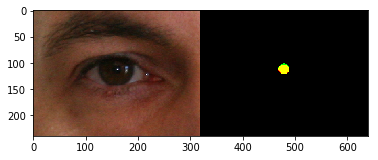

001: Dice Coeff = 0.762559
0.762559


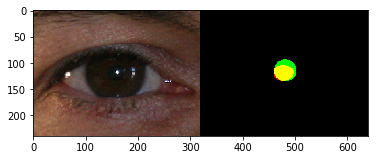

002: Dice Coeff = 0.808905
0.808905


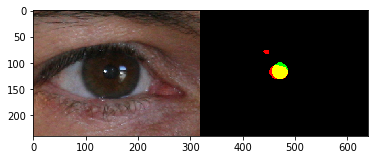

003: Dice Coeff = 0.801949
0.801949


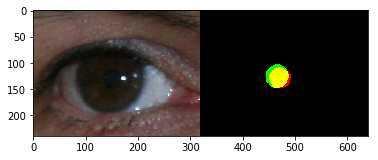

004: Dice Coeff = 0.701505
0.701505


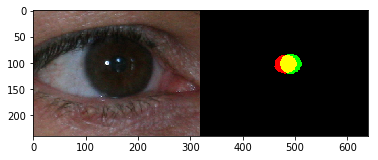

005: Dice Coeff = 0.696970
0.696970


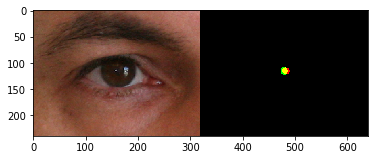

006: Dice Coeff = 0.826884
0.826884


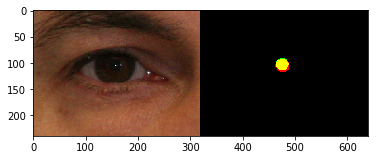

007: Dice Coeff = 0.781469
0.781469


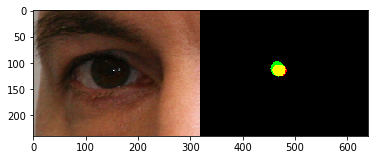

008: Dice Coeff = 0.928571
0.928571


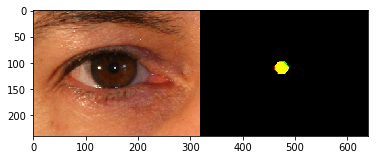

009: Dice Coeff = 0.920732
0.920732


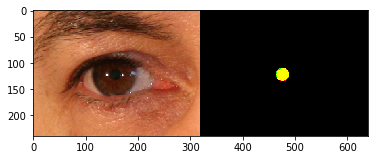

010: Dice Coeff = 0.885714
0.885714


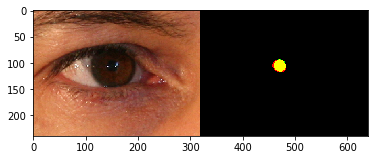

011: Dice Coeff = 0.502513
0.502513


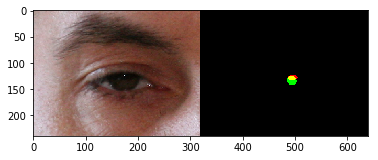

012: Dice Coeff = 0.829408
0.829408


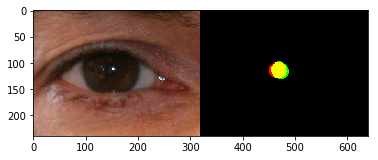

013: Dice Coeff = 0.927066
0.927066


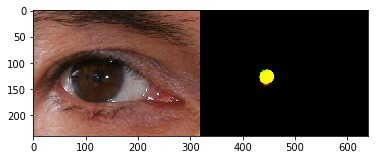

014: Dice Coeff = 0.597234
0.597234


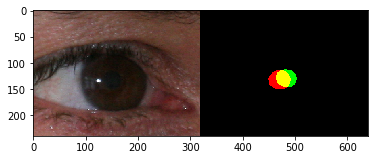

015: Dice Coeff = 0.866203
0.866203


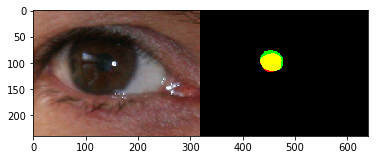

016: Dice Coeff = 0.772894
0.772894


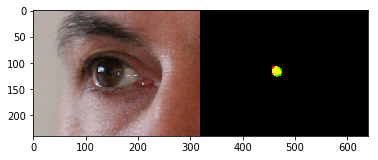

017: Dice Coeff = 0.918121
0.918121


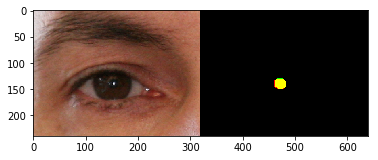

018: Dice Coeff = 0.899736
0.899736


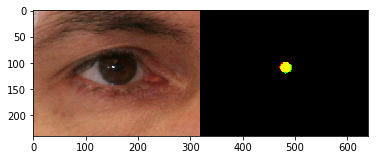

019: Dice Coeff = 0.886124
0.886124


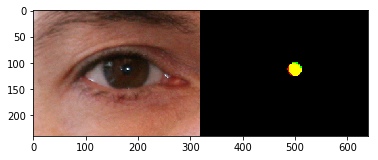

020: Dice Coeff = 0.811935
0.811935


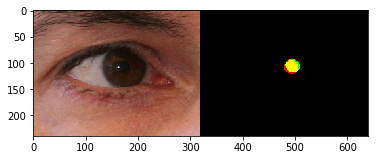

021: Dice Coeff = 0.805714
0.805714


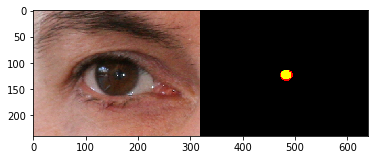

022: Dice Coeff = 0.835866
0.835866


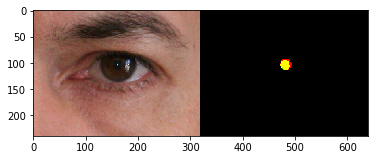

023: Dice Coeff = 0.945946
0.945946


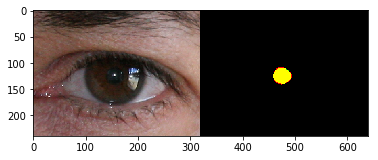

024: Dice Coeff = 0.908883
0.908883


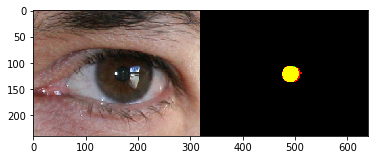

025: Dice Coeff = 0.849709
0.849709


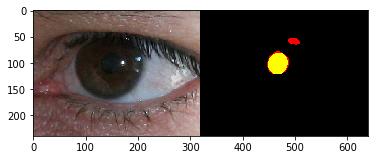

026: Dice Coeff = 0.909844
0.909844


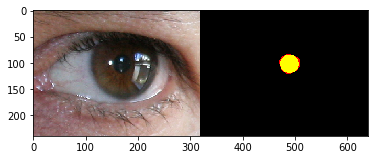

027: Dice Coeff = 0.841918
0.841918


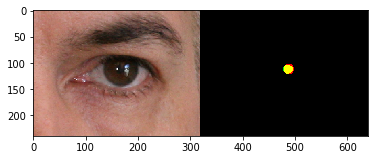

028: Dice Coeff = 0.901596
0.901596


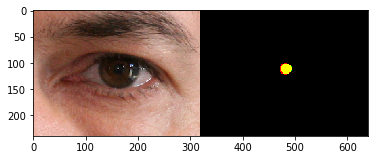

029: Dice Coeff = 0.744539
0.744539


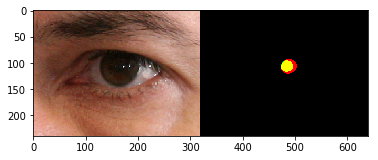

030: Dice Coeff = 0.820423
0.820423


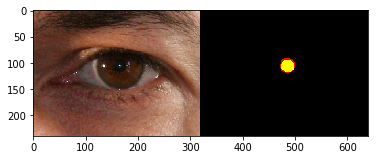

031: Dice Coeff = 0.865221
0.865221


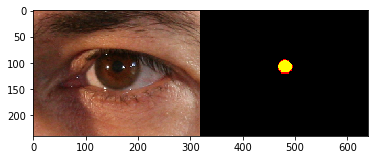

032: Dice Coeff = 0.831088
0.831088


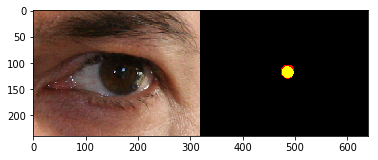

033: Dice Coeff = 0.824096
0.824096


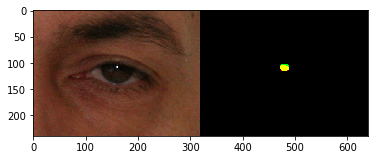

034: Dice Coeff = 0.849441
0.849441


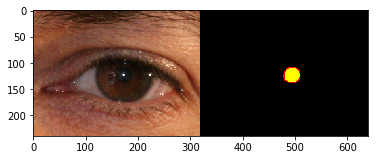

035: Dice Coeff = 0.886403
0.886403


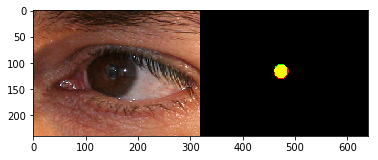

036: Dice Coeff = 0.848231
0.848231


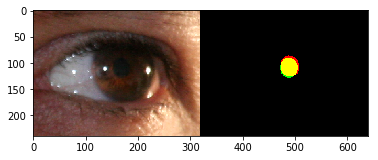

037: Dice Coeff = 0.848065
0.848065


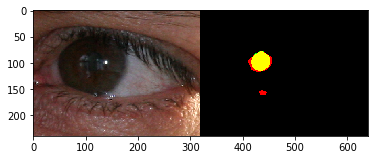

038: Dice Coeff = 0.875878
0.875878


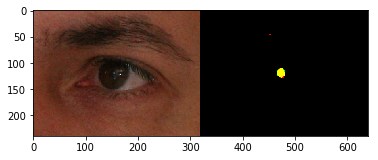

039: Dice Coeff = 0.784141
0.784141


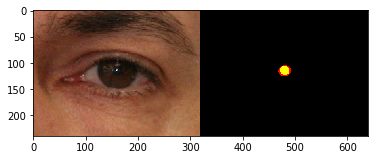

040: Dice Coeff = 0.842857
0.842857


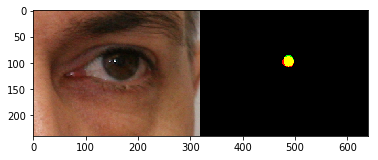

041: Dice Coeff = 0.883721
0.883721


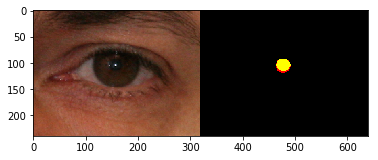

042: Dice Coeff = 0.892606
0.892606


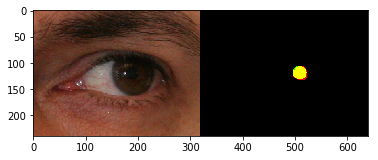

043: Dice Coeff = 0.821983
0.821983


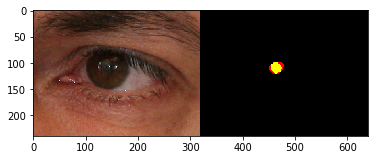

044: Dice Coeff = 0.794245
0.794245


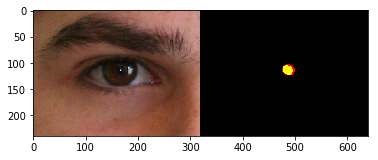

045: Dice Coeff = 0.773239
0.773239


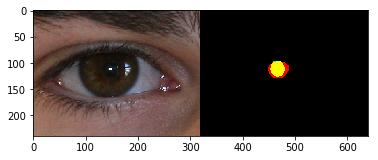

046: Dice Coeff = 0.827374
0.827374


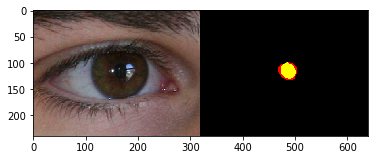

047: Dice Coeff = 0.884371
0.884371


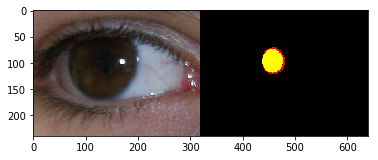

048: Dice Coeff = 0.891859
0.891859


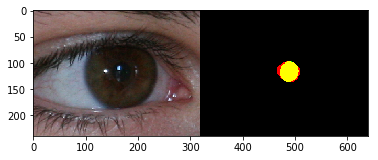

049: Dice Coeff = 0.761726
0.761726


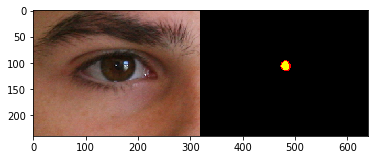

050: Dice Coeff = 0.853090
0.853090


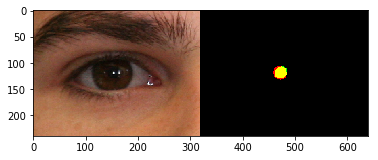

051: Dice Coeff = 0.758772
0.758772


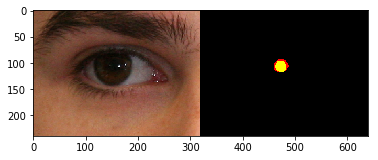

052: Dice Coeff = 0.835604
0.835604


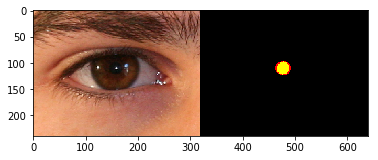

053: Dice Coeff = 0.865314
0.865314


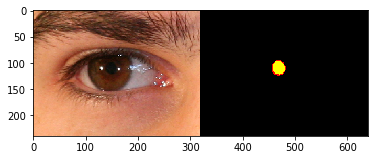

054: Dice Coeff = 0.878199
0.878199


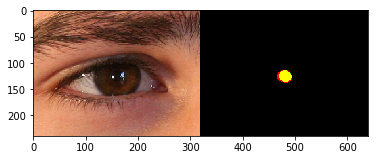

055: Dice Coeff = 0.837294
0.837294


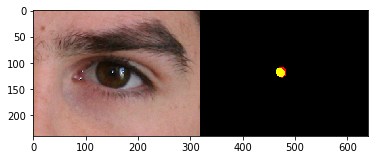

056: Dice Coeff = 0.891678
0.891678


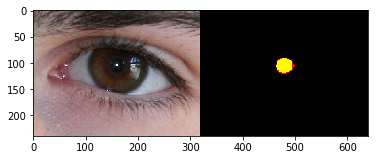

057: Dice Coeff = 0.844875
0.844875


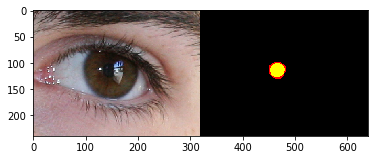

058: Dice Coeff = 0.893551
0.893551


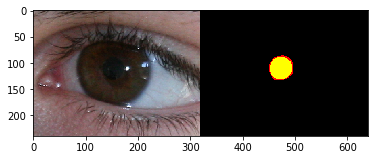

059: Dice Coeff = 0.892228
0.892228


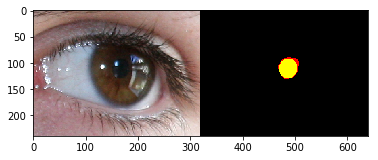

060: Dice Coeff = 0.898711
0.898711


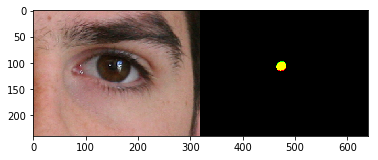

061: Dice Coeff = 0.854592
0.854592


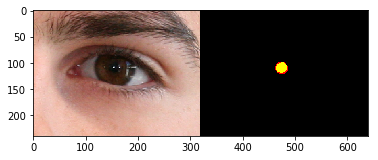

062: Dice Coeff = 0.839092
0.839092


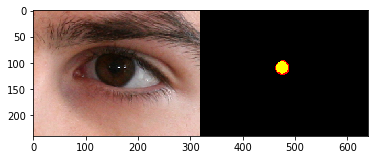

063: Dice Coeff = 0.803571
0.803571


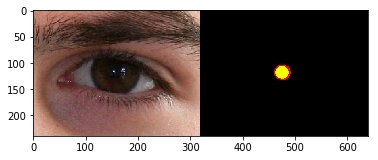

064: Dice Coeff = 0.761982
0.761982


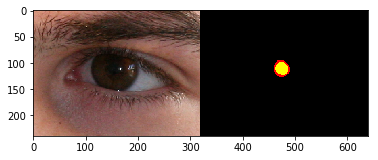

065: Dice Coeff = 0.822060
0.822060


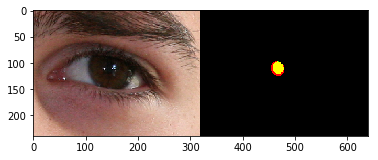

066: Dice Coeff = 0.764706
0.764706


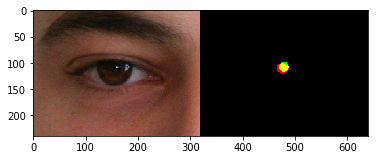

067: Dice Coeff = 0.839560
0.839560


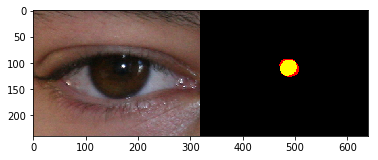

068: Dice Coeff = 0.843104
0.843104


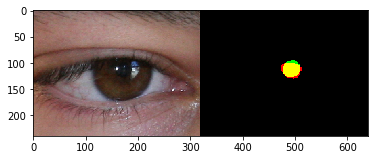

069: Dice Coeff = 0.624492
0.624492


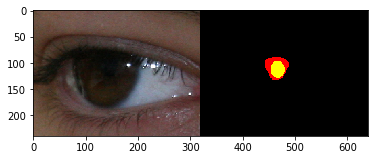

070: Dice Coeff = 0.825553
0.825553


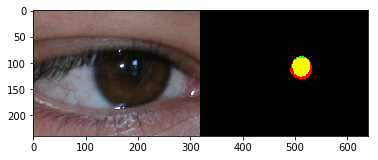

071: Dice Coeff = 0.809836
0.809836


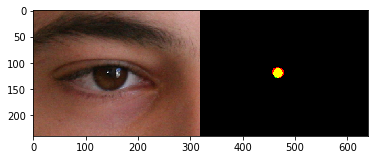

072: Dice Coeff = 0.842697
0.842697


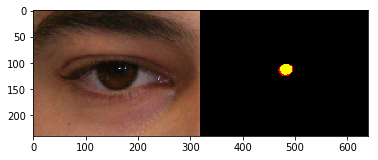

073: Dice Coeff = 0.857745
0.857745


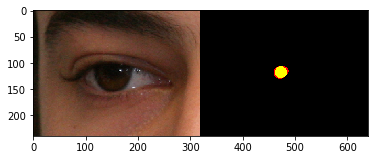

074: Dice Coeff = 0.821705
0.821705


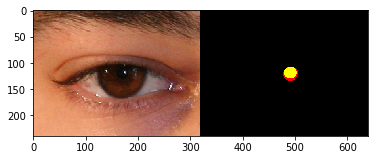

075: Dice Coeff = 0.827038
0.827038


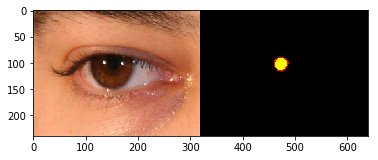

076: Dice Coeff = 0.659168
0.659168


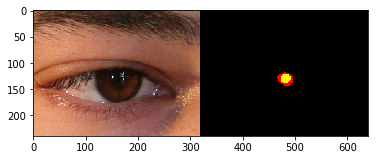

077: Dice Coeff = 0.806452
0.806452


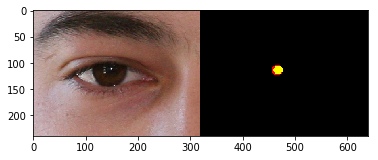

078: Dice Coeff = 0.694348
0.694348


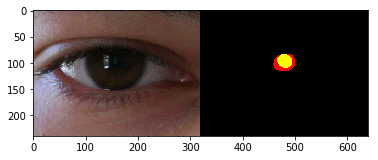

079: Dice Coeff = 0.848939
0.848939


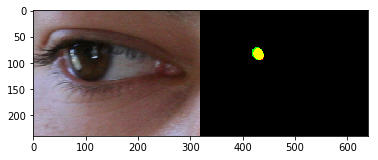

080: Dice Coeff = 0.670096
0.670096


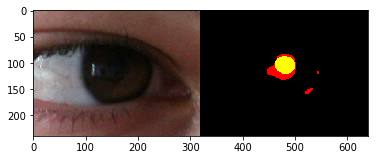

081: Dice Coeff = 0.554101
0.554101


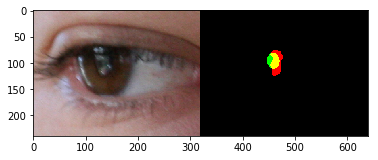

082: Dice Coeff = 0.605664
0.605664


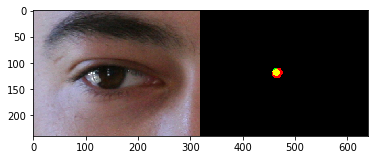

083: Dice Coeff = 0.767414
0.767414


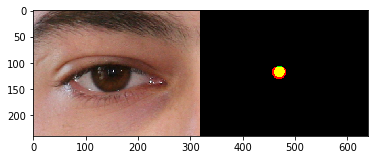

084: Dice Coeff = 0.816193
0.816193


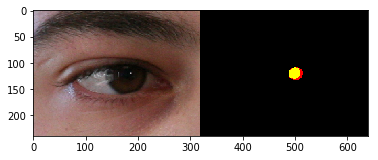

085: Dice Coeff = 0.818580
0.818580


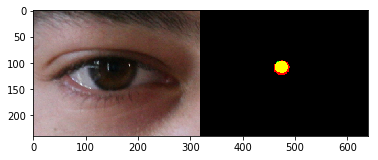

086: Dice Coeff = 0.751488
0.751488


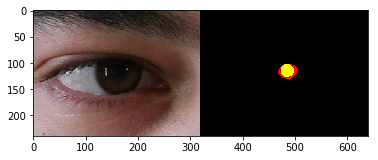

087: Dice Coeff = 0.647059
0.647059


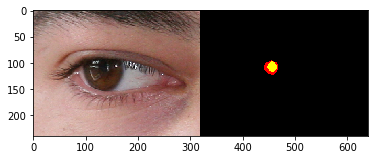

088: Dice Coeff = 0.895082
0.895082


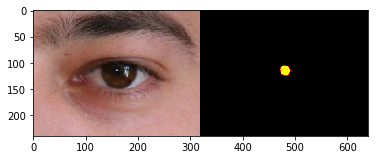

089: Dice Coeff = 0.806096
0.806096


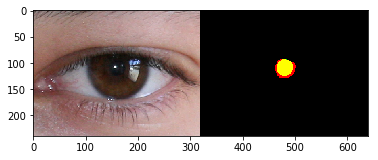

090: Dice Coeff = 0.807042
0.807042


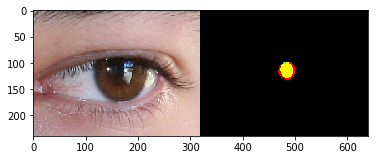

091: Dice Coeff = 0.896308
0.896308


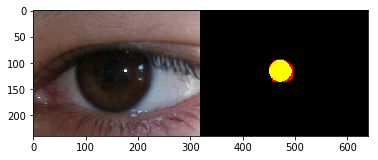

092: Dice Coeff = 0.906999
0.906999


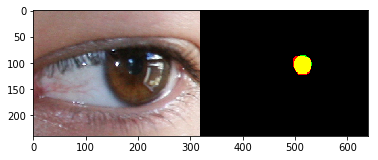

093: Dice Coeff = 0.835341
0.835341


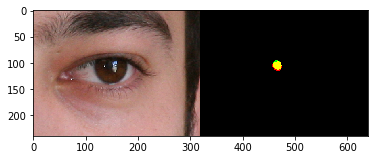

094: Dice Coeff = 0.848414
0.848414


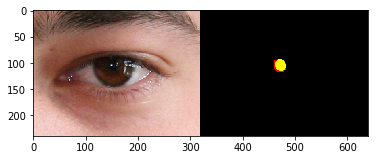

095: Dice Coeff = 0.567604
0.567604


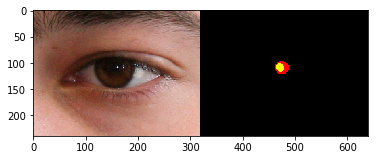

096: Dice Coeff = 0.706093
0.706093


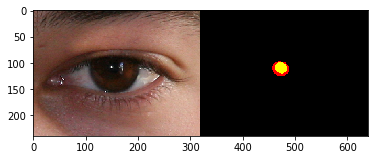

097: Dice Coeff = 0.853261
0.853261


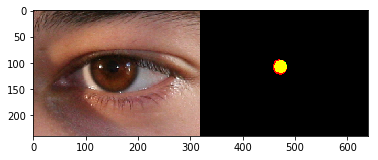

098: Dice Coeff = 0.790816
0.790816


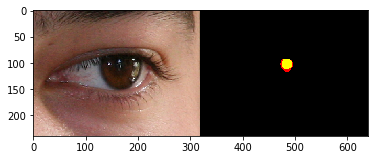

099: Dice Coeff = 0.709193
0.709193


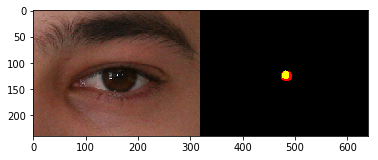

100: Dice Coeff = 0.619420
0.619420


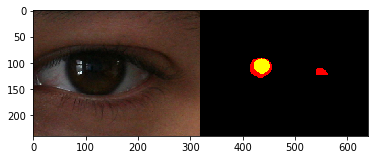

101: Dice Coeff = 0.624408
0.624408


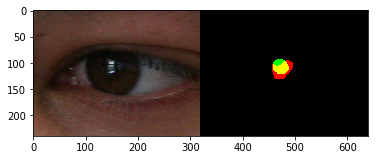

102: Dice Coeff = 0.476274
0.476274


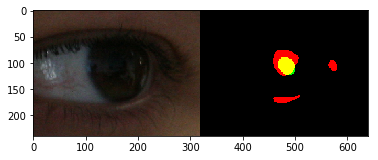

103: Dice Coeff = 0.599779
0.599779


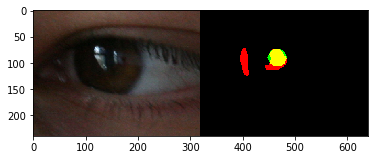

104: Dice Coeff = 0.494572
0.494572


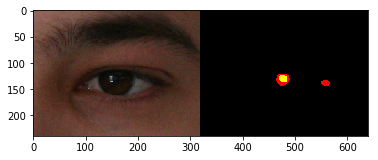

105: Dice Coeff = 0.634961
0.634961


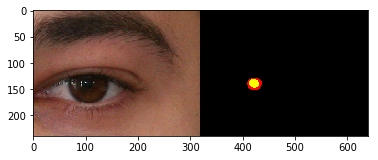

106: Dice Coeff = 0.631319
0.631319


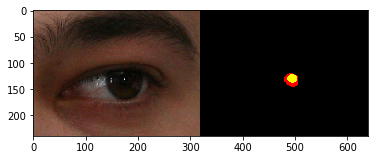

107: Dice Coeff = 0.641725
0.641725


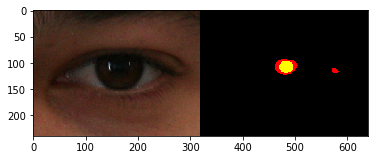

108: Dice Coeff = 0.773301
0.773301


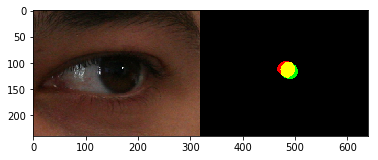

109: Dice Coeff = 0.599572
0.599572


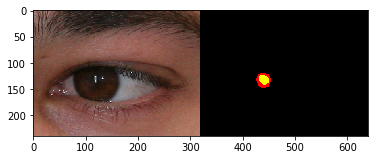

110: Dice Coeff = 0.662162
0.662162


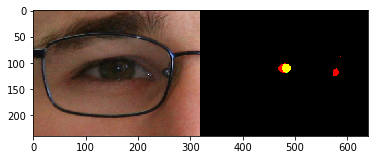

111: Dice Coeff = 0.812846
0.812846


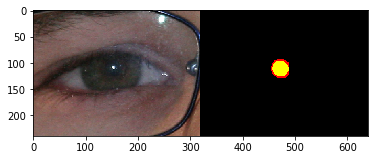

112: Dice Coeff = 0.711663
0.711663


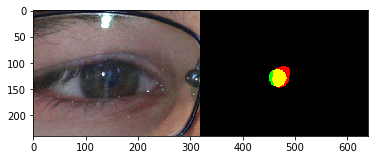

113: Dice Coeff = 0.828719
0.828719


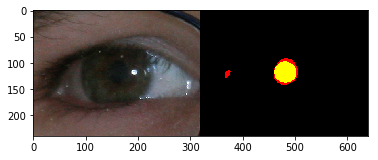

114: Dice Coeff = 0.884772
0.884772


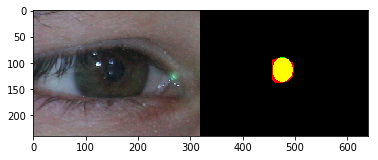

115: Dice Coeff = 0.652807
0.652807


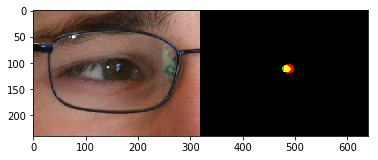

116: Dice Coeff = 0.758547
0.758547


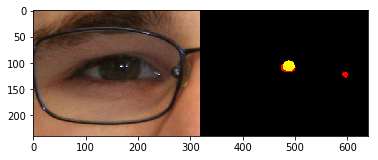

117: Dice Coeff = 0.558987
0.558987


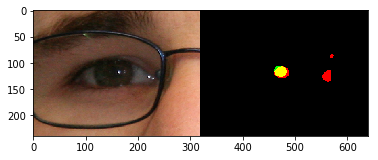

118: Dice Coeff = 0.866062
0.866062


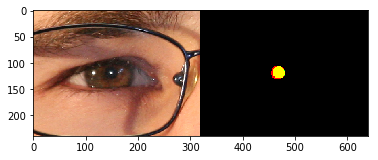

119: Dice Coeff = 0.865128
0.865128


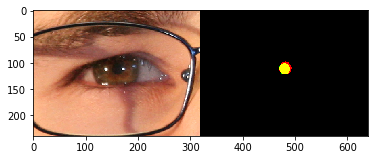

120: Dice Coeff = 0.864041
0.864041


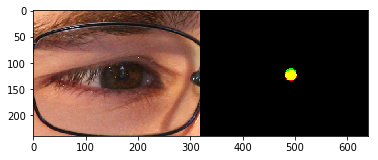

121: Dice Coeff = 0.811881
0.811881


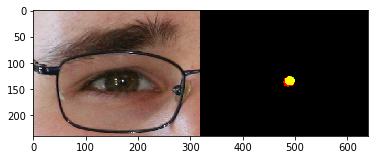

122: Dice Coeff = 0.788483
0.788483


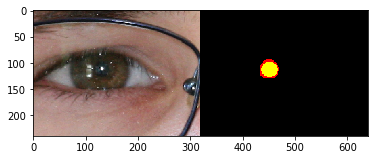

123: Dice Coeff = 0.757460
0.757460


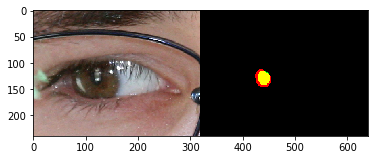

124: Dice Coeff = 0.822900
0.822900


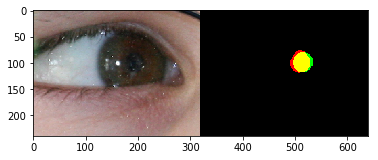

125: Dice Coeff = 0.767948
0.767948


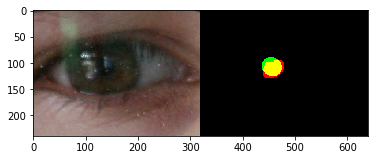

126: Dice Coeff = 0.527383
0.527383


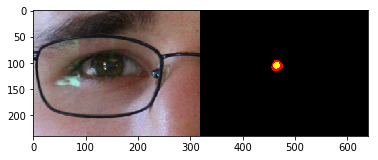

127: Dice Coeff = 0.730077
0.730077


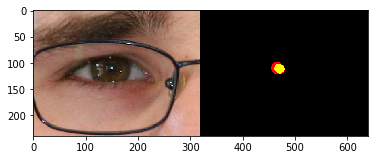

128: Dice Coeff = 0.801956
0.801956


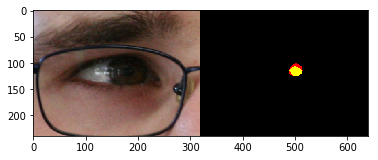

129: Dice Coeff = 0.666078
0.666078


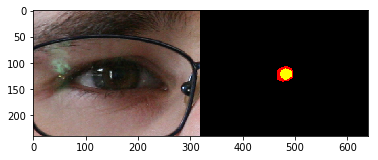

130: Dice Coeff = 0.866928
0.866928


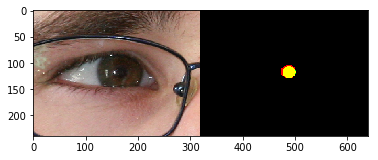

131: Dice Coeff = 0.670956
0.670956


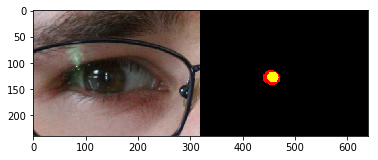

132: Dice Coeff = 0.871705
0.871705


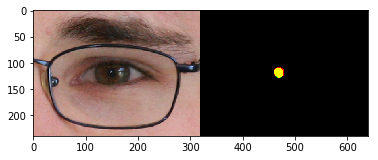

133: Dice Coeff = 0.834327
0.834327


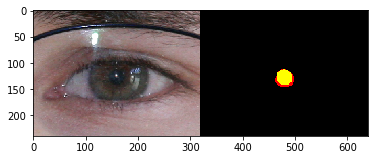

134: Dice Coeff = 0.785430
0.785430


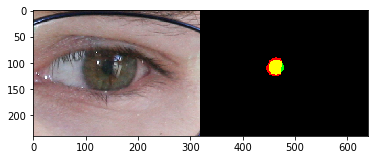

135: Dice Coeff = 0.806829
0.806829


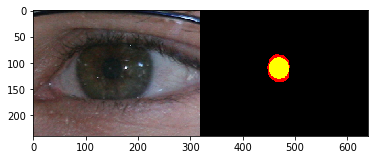

136: Dice Coeff = 0.834862
0.834862


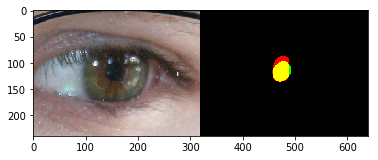

137: Dice Coeff = 0.360000
0.360000


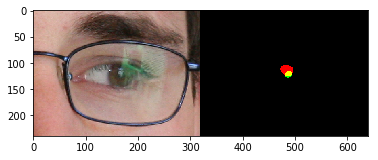

138: Dice Coeff = 0.949677
0.949677


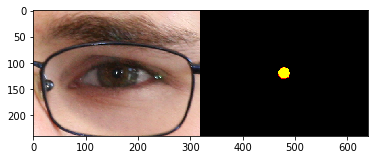

139: Dice Coeff = 0.831683
0.831683


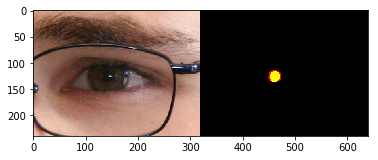

140: Dice Coeff = 0.844486
0.844486


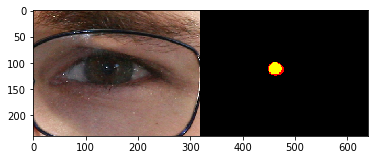

141: Dice Coeff = 0.520147
0.520147


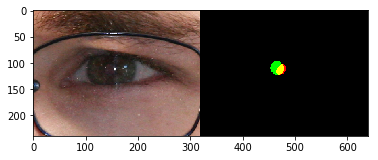

142: Dice Coeff = 0.811983
0.811983


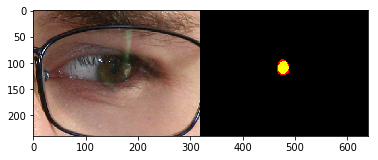

143: Dice Coeff = 0.760108
0.760108


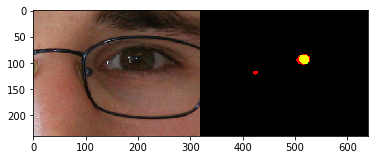

144: Dice Coeff = 0.771098
0.771098


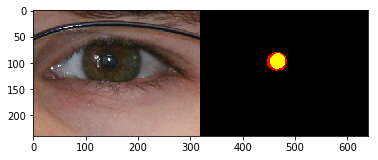

145: Dice Coeff = 0.771069
0.771069


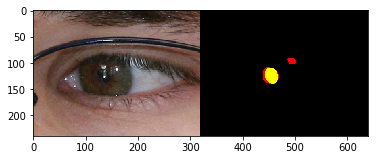

146: Dice Coeff = 0.807005
0.807005


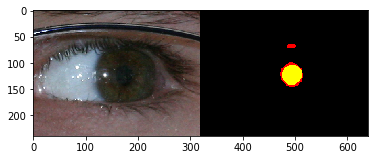

147: Dice Coeff = 0.432631
0.432631


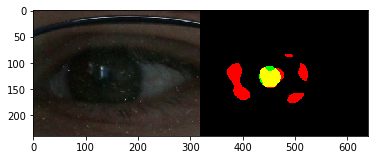

148: Dice Coeff = 0.517572
0.517572


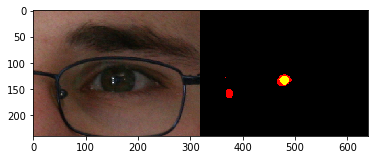

149: Dice Coeff = 0.710434
0.710434


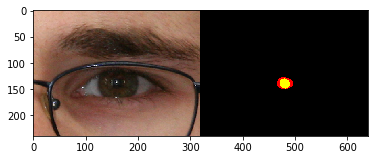

150: Dice Coeff = 0.694082
0.694082


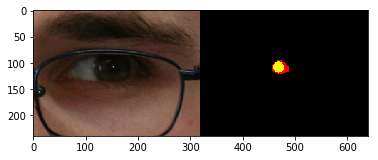

151: Dice Coeff = 0.529801
0.529801


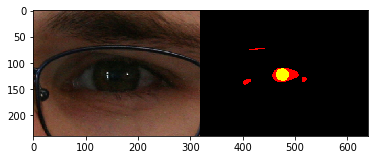

152: Dice Coeff = 0.818257
0.818257


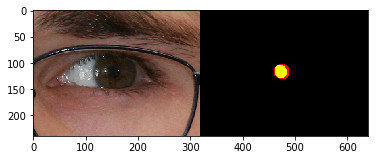

153: Dice Coeff = 0.420757
0.420757


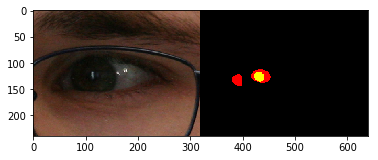

154: Dice Coeff = 0.825893
0.825893


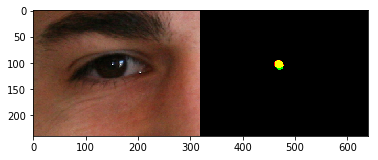

155: Dice Coeff = 0.730689
0.730689


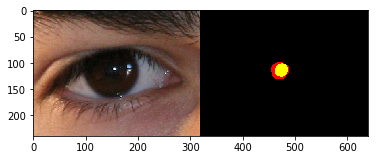

156: Dice Coeff = 0.788540
0.788540


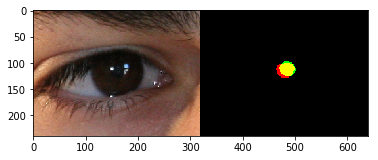

157: Dice Coeff = 0.602502
0.602502


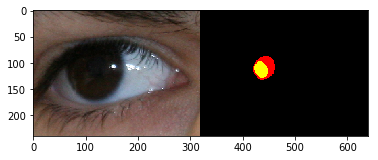

158: Dice Coeff = 0.864928
0.864928


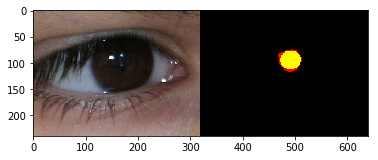

159: Dice Coeff = 0.458252
0.458252


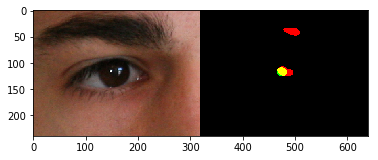

160: Dice Coeff = 0.622642
0.622642


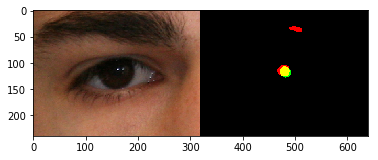

161: Dice Coeff = 0.753577
0.753577


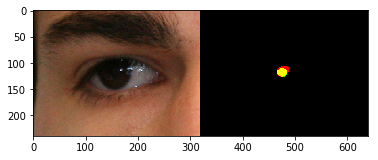

162: Dice Coeff = 0.768031
0.768031


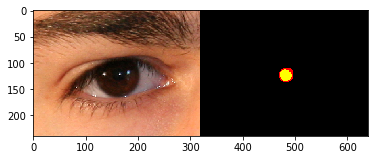

163: Dice Coeff = 0.787097
0.787097


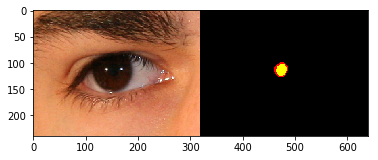

164: Dice Coeff = 0.803069
0.803069


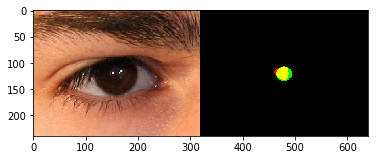

165: Dice Coeff = 0.716332
0.716332


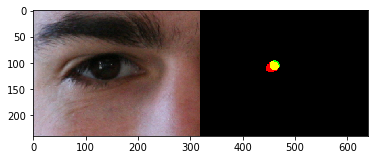

166: Dice Coeff = 0.790727
0.790727


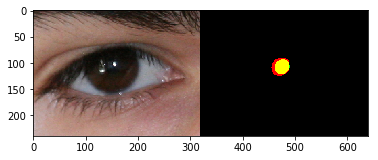

167: Dice Coeff = 0.855006
0.855006


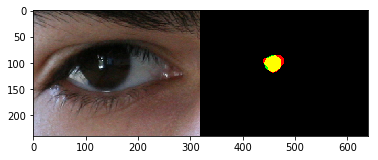

168: Dice Coeff = 0.740244
0.740244


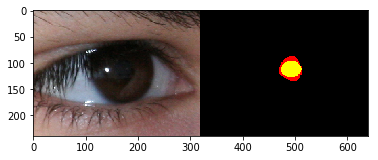

169: Dice Coeff = 0.732108
0.732108


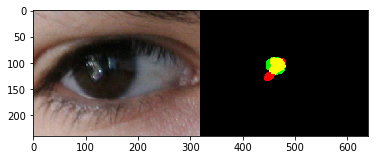

170: Dice Coeff = 0.553936
0.553936


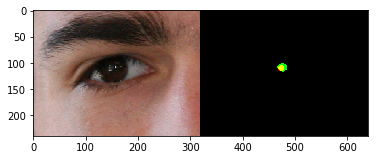

171: Dice Coeff = 0.799423
0.799423


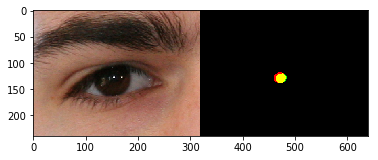

172: Dice Coeff = 0.835165
0.835165


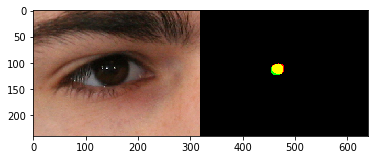

173: Dice Coeff = 0.784832
0.784832


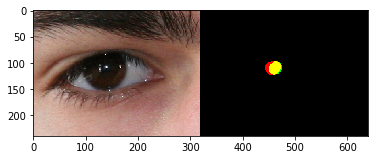

174: Dice Coeff = 0.885694
0.885694


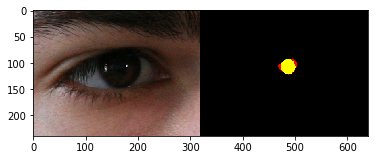

175: Dice Coeff = 0.834164
0.834164


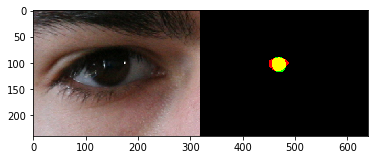

176: Dice Coeff = 0.759055
0.759055


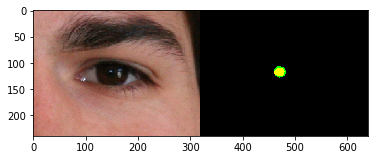

177: Dice Coeff = 0.905817
0.905817


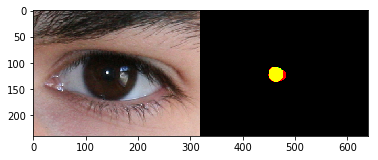

178: Dice Coeff = 0.842279
0.842279


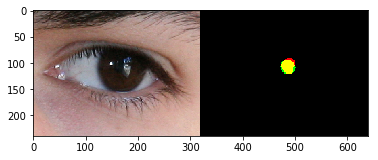

179: Dice Coeff = 0.898561
0.898561


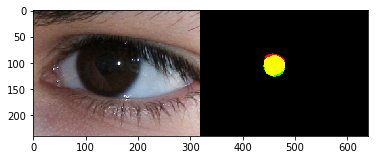

180: Dice Coeff = 0.809001
0.809001


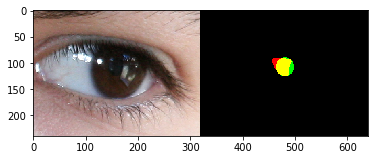

181: Dice Coeff = 0.566176
0.566176


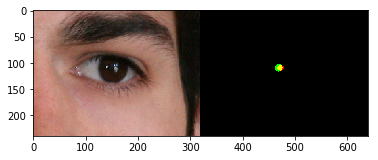

182: Dice Coeff = 0.741683
0.741683


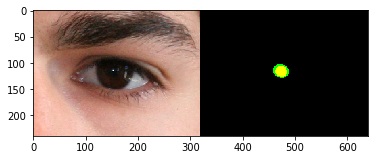

183: Dice Coeff = 0.551784
0.551784


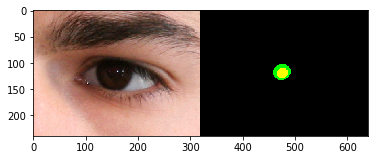

184: Dice Coeff = 0.850928
0.850928


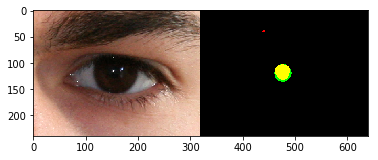

185: Dice Coeff = 0.878545
0.878545


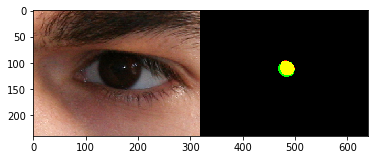

186: Dice Coeff = 0.708075
0.708075


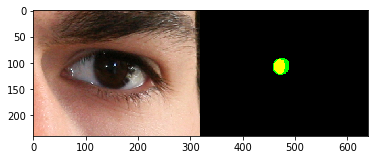

187: Dice Coeff = 0.536019
0.536019


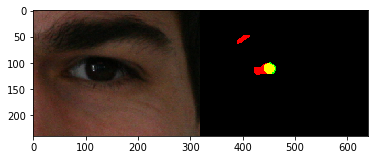

188: Dice Coeff = 0.889709
0.889709


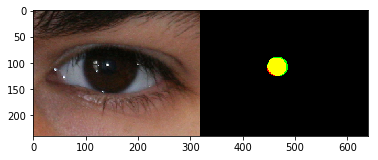

189: Dice Coeff = 0.851929
0.851929


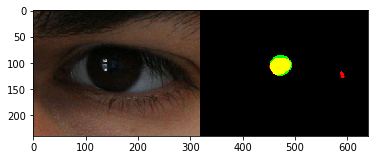

190: Dice Coeff = 0.722566
0.722566


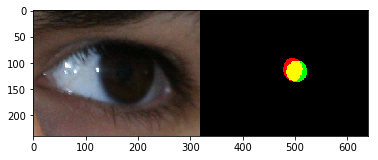

191: Dice Coeff = 0.612008
0.612008


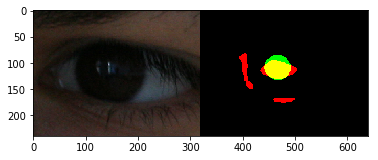

192: Dice Coeff = 0.646288
0.646288


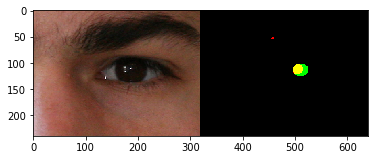

193: Dice Coeff = 0.855186
0.855186


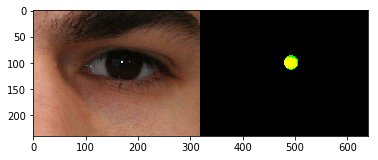

194: Dice Coeff = 0.619048
0.619048


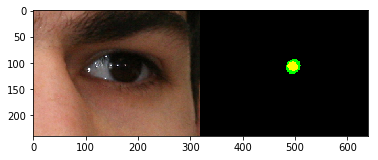

195: Dice Coeff = 0.779254
0.779254


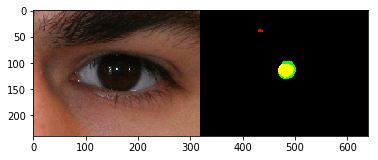

196: Dice Coeff = 0.798201
0.798201


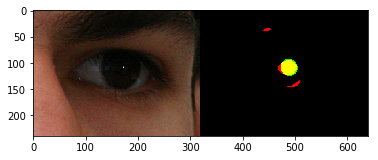

197: Dice Coeff = 0.653990
0.653990


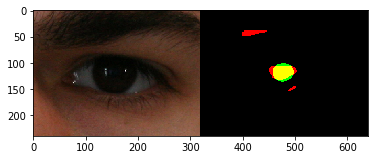

198: Dice Coeff = 0.895238
0.895238


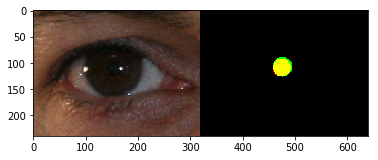

199: Dice Coeff = 0.893343
0.893343


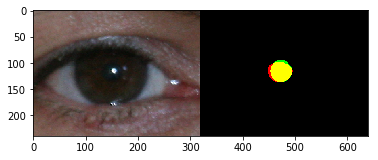

200: Dice Coeff = 0.919374
0.919374


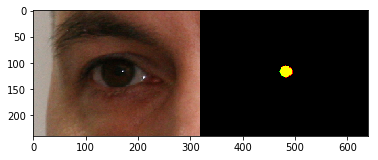

201: Dice Coeff = 0.877384
0.877384


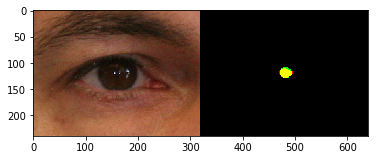

202: Dice Coeff = 0.649775
0.649775


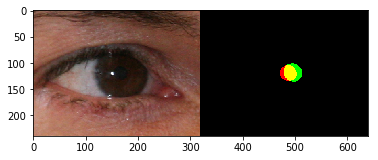

203: Dice Coeff = 0.856831
0.856831


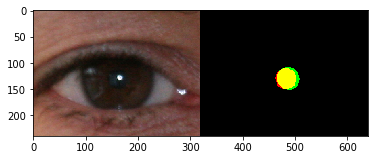

204: Dice Coeff = 0.846591
0.846591


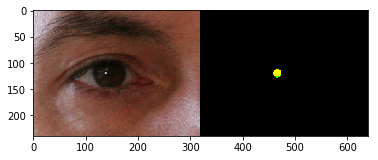

205: Dice Coeff = 0.908507
0.908507


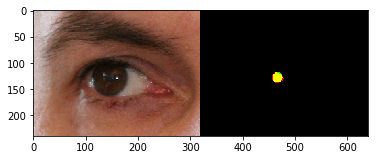

206: Dice Coeff = 0.883333
0.883333


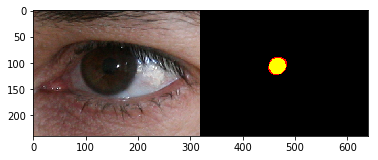

207: Dice Coeff = 0.904890
0.904890


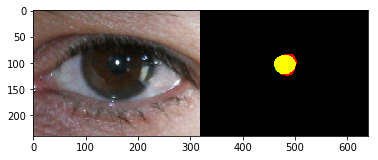

208: Dice Coeff = 0.873706
0.873706


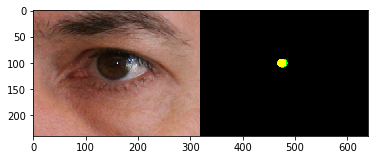

209: Dice Coeff = 0.914557
0.914557


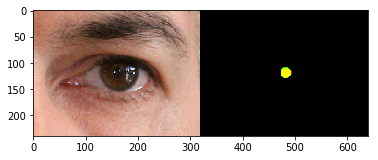

210: Dice Coeff = 0.857343
0.857343


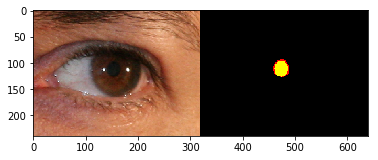

211: Dice Coeff = 0.896552
0.896552


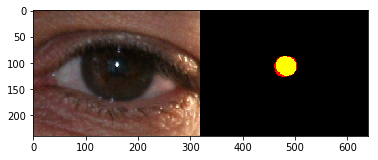

212: Dice Coeff = 0.715064
0.715064


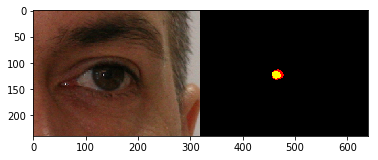

213: Dice Coeff = 0.701031
0.701031


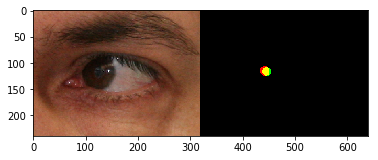

214: Dice Coeff = 0.782772
0.782772


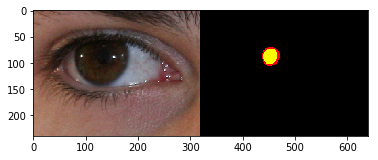

215: Dice Coeff = 0.879514
0.879514


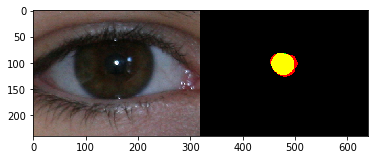

216: Dice Coeff = 0.678363
0.678363


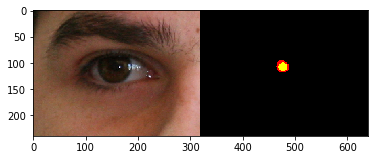

217: Dice Coeff = 0.727072
0.727072


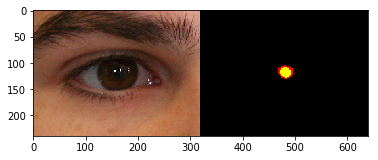

218: Dice Coeff = 0.834158
0.834158


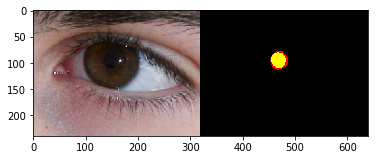

219: Dice Coeff = 0.921370
0.921370


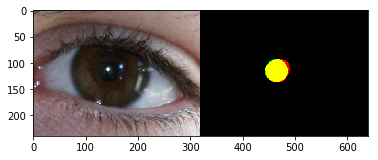

220: Dice Coeff = 0.934641
0.934641


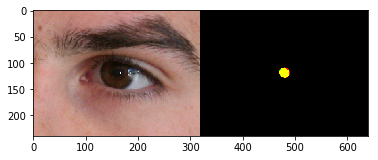

221: Dice Coeff = 0.895086
0.895086


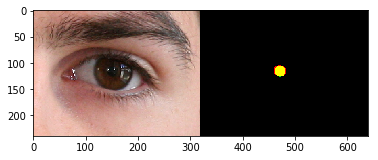

222: Dice Coeff = 0.757556
0.757556


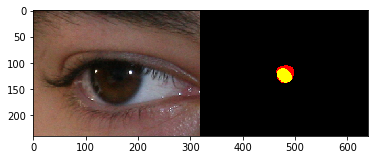

223: Dice Coeff = 0.841837
0.841837


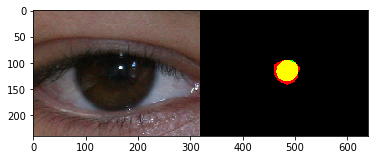

224: Dice Coeff = 0.777419
0.777419


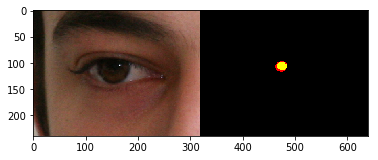

225: Dice Coeff = 0.750920
0.750920


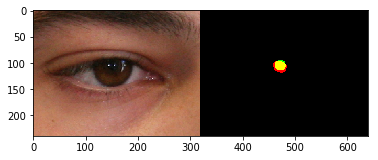

226: Dice Coeff = 0.746344
0.746344


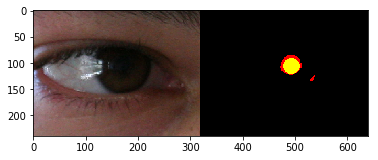

227: Dice Coeff = 0.919924
0.919924


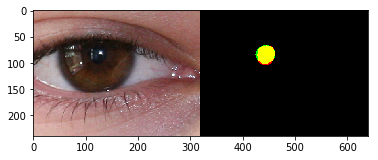

228: Dice Coeff = 0.773676
0.773676


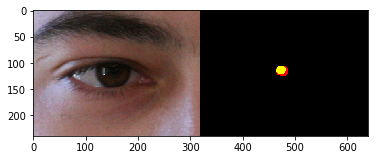

229: Dice Coeff = 0.802111
0.802111


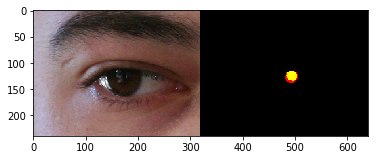

230: Dice Coeff = 0.845787
0.845787


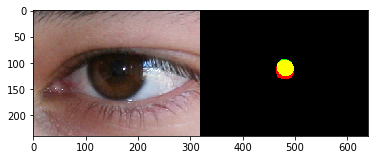

231: Dice Coeff = 0.923077
0.923077


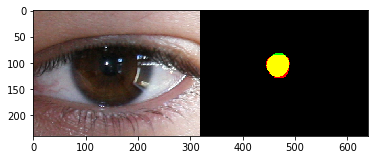

232: Dice Coeff = 0.670635
0.670635


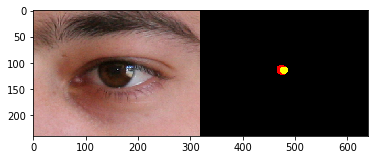

233: Dice Coeff = 0.688525
0.688525


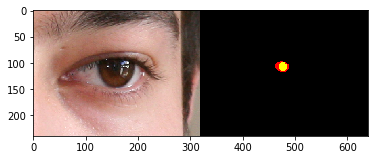

234: Dice Coeff = 0.794928
0.794928


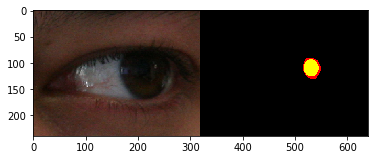

235: Dice Coeff = 0.857901
0.857901


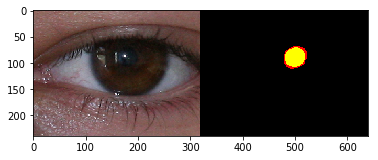

236: Dice Coeff = 0.753247
0.753247


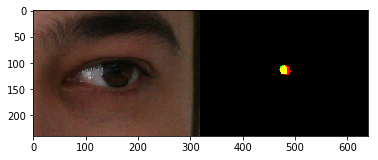

237: Dice Coeff = 0.379284
0.379284


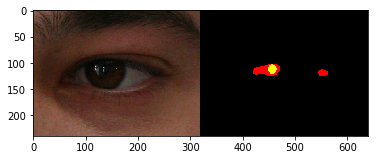

238: Dice Coeff = 0.802794
0.802794


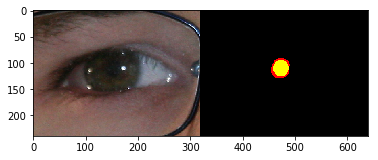

239: Dice Coeff = 0.821754
0.821754


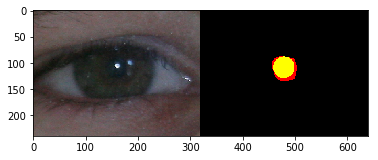

240: Dice Coeff = 0.670090
0.670090


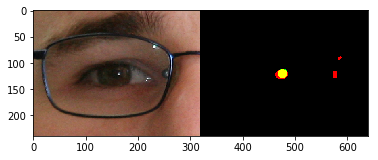

241: Dice Coeff = 0.671412
0.671412


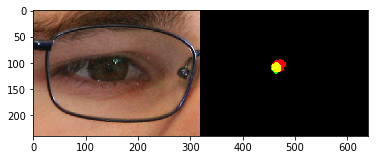

242: Dice Coeff = 0.585086
0.585086


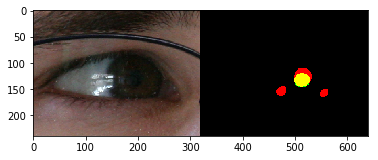

243: Dice Coeff = 0.744408
0.744408


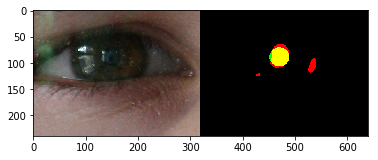

244: Dice Coeff = 0.706087
0.706087


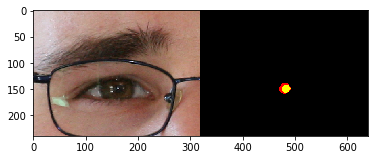

245: Dice Coeff = 0.738122
0.738122


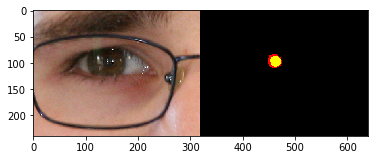

246: Dice Coeff = 0.921850
0.921850


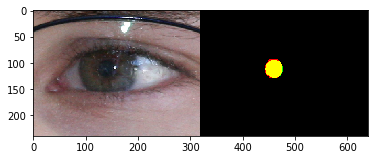

247: Dice Coeff = 0.837892
0.837892


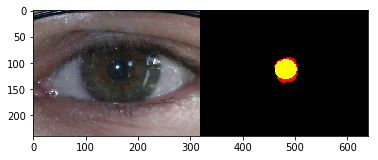

248: Dice Coeff = 0.842105
0.842105


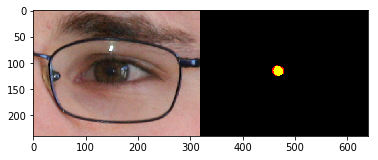

249: Dice Coeff = 0.765579
0.765579


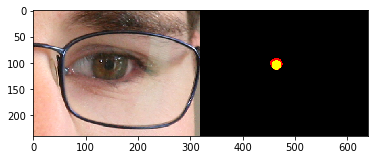

250: Dice Coeff = 0.845501
0.845501


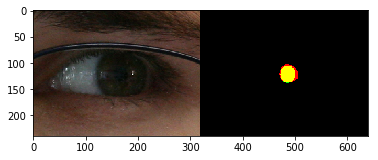

251: Dice Coeff = 0.450017
0.450017


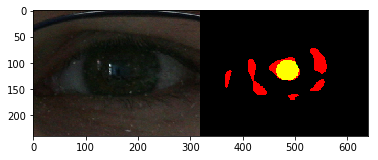

252: Dice Coeff = 0.769029
0.769029


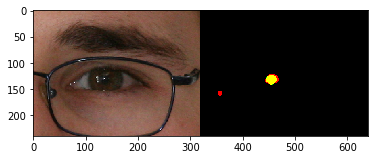

253: Dice Coeff = 0.917955
0.917955


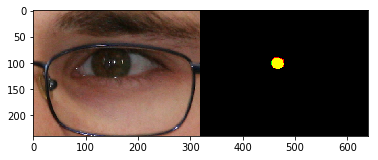

254: Dice Coeff = 0.703015
0.703015


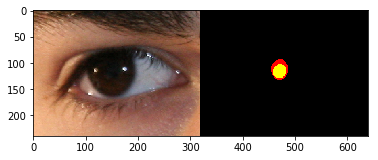

255: Dice Coeff = 0.590774
0.590774


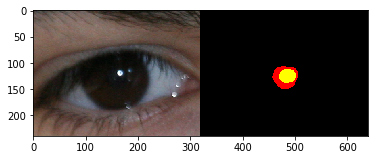

256: Dice Coeff = 0.601367
0.601367


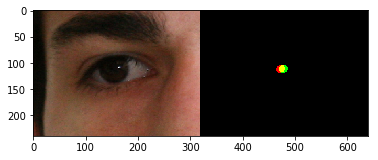

257: Dice Coeff = 0.866120
0.866120


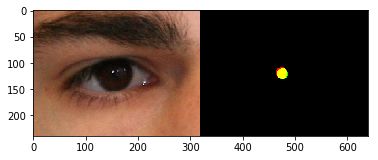

258: Dice Coeff = 0.608773
0.608773


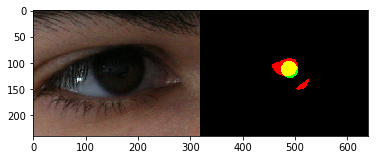

259: Dice Coeff = 0.797886
0.797886


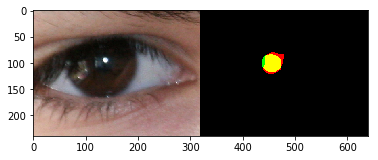

260: Dice Coeff = 0.741021
0.741021


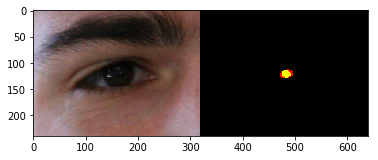

261: Dice Coeff = 0.720950
0.720950


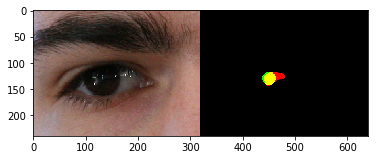

262: Dice Coeff = 0.779008
0.779008


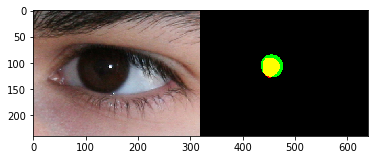

263: Dice Coeff = 0.791595
0.791595


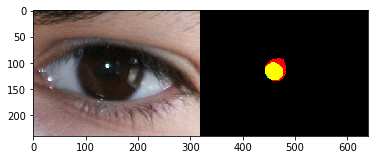

264: Dice Coeff = 0.000000
0.000000


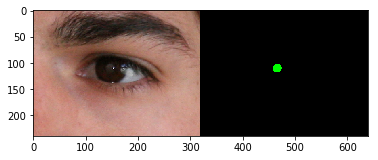

265: Dice Coeff = 0.816269
0.816269


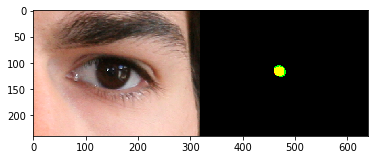

266: Dice Coeff = 0.436643
0.436643


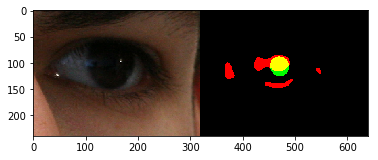

267: Dice Coeff = 0.857666
0.857666


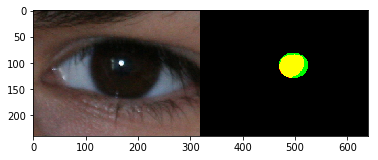

268: Dice Coeff = 0.238219
0.238219


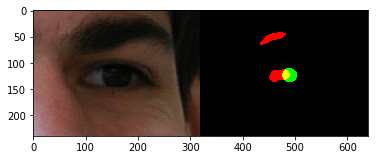

269: Dice Coeff = 0.529105
0.529105


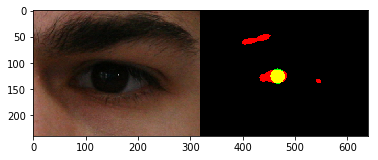

Dice eval av. : 0.768836


In [20]:
    from PIL import Image
    import matplotlib.pyplot as plt

    n = 0
    dice_eval = []
    
    for i in range(len(fpaths_xs_test)):
        # テスト画像
        im1 = Image.open(fpaths_xs_test[i])
        im1 = im1.resize((320,240)) 
        # 出力結果
        im2 = Image.open(os.path.join(dname_outputs, "%05d.png"%(n)))
        im2 = im2.resize((320,240))
        # Grond Truth
        im3 = Image.open(fpaths_ys_test[i])
        im3 = im3.resize((320,240))

        im2_d = np.zeros((240,320,3), 'uint8')
        im2_d[:,:,0] = np.array(im2)
        im2_d[:,:,1] = np.array(im3)*255
        im2_d[:,:,2] = 0

        # Compute dice coeff
        im2a = np.array(im2)
        im2a[im2a > 0] = 1
        im3a = np.array(im3)
        im3a[im3a > 0] = 1
        
        overlap_a = np.array(im2a) * np.array(im3a)
        overlap_b = np.array(im2a) + np.array(im3a)
        print('%03d: Dice Coeff = %f'%(i, 2*sum(sum(overlap_a))/sum(sum(overlap_b))))
        print('%f'%img_dice_coeff(im2,im3))
        dice_eval.append(2*sum(sum(overlap_a))/sum(sum(overlap_b)))

        plt.imshow(np.hstack((np.array(im1),np.array(im2_d))))
        plt.show()

        n = n + 1
    
    print('Dice eval av. : %f'%np.mean(np.array(dice_eval)))

checkpoints_fcn02/history.pkl


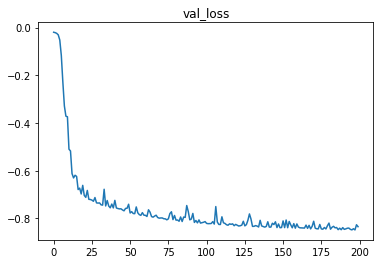

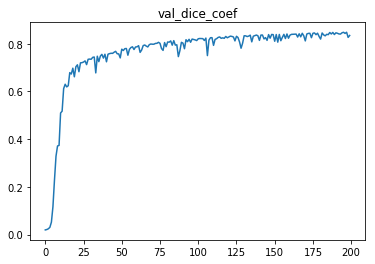

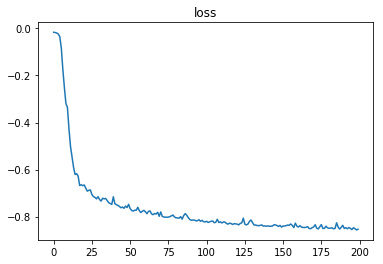

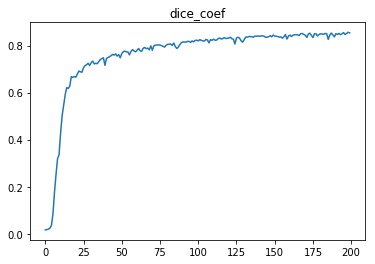

In [21]:
#
#   Show History
#
mode = "SHOW_HISTORY"
if mode == "SHOW_HISTORY":
    # load pickle
    print(dname_checkpoints + '/' + fname_history)
    history = pickle.load(open(dname_checkpoints + '/' + fname_history, 'rb'))
    
    for k in history.keys():
        plt.plot(history[k])
        plt.title(k)
        plt.show()


dict_keys(['val_loss', 'val_dice_coef', 'loss', 'dice_coef'])
